<div class="alert alert-info">
    <h1><strong>2022 Cleveland In-Person Summer Camp Day 3 Lab</strong></h1>
    <h2>Coding Quantum Circuits with Qiskit</h2>
</div>

In [2]:
from qiskit import QuantumCircuit, Aer, IBMQ, execute
from qiskit.visualization import plot_histogram, visualize_transition

print("Libraries imported successfully!")

Libraries imported successfully!


___

## This Notebook goes over:
* Creating `QuantumCircuits`
* Applying Gates
* Visualizing Gates as rotations
* Simulating Circuits
* Running scripts on real quantum devices

### The `QuantumCircuit` Class
The `QuantumCircuit` class is Qiskit's way of designing a quantum circuit. It takes two inputs: `qubits` and `classical bits` , both of which tell the circuit how many qubits and classical bits to use.

We can build a quantum circuit in Qiskit with the following:
```python
qc = QuantumCircuit(q,c)
```

In [3]:
# This creates a quantum circuit with 1 qubit and 1 classical bit
qc = QuantumCircuit(1,1)

### Drawing and Displaying Circuits

Qiskit has a function called `circ.draw()` that we use for drawing a diagram of circuits. We can also specify the output type. Here, we choose to use matplotlib `output="mpl"`.

Together, we can visualize our circuit with: `circ.draw(output="mpl")`

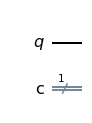

In [4]:
# This prints out a diagram of the circuit, the "mpl" makes it look pretty!
qc.draw(output="mpl")

### Adding gates to a quantum circuit
This can be done by calling the `qc.gate(qubit)` command. 
Here the `gate` refers to the gate type, and the `qubit` refers to the qubit (or qubits) on which the gate is acting.

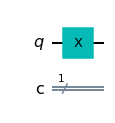

In [5]:
# Adding a NOT gate (aka an X gate) to qubit 0
qc.x(0)
qc.draw(output="mpl")

### Visualizing the rotation on the Bloch sphere of a gate
This can be done by calling the `visualize_transition(QuantumCircuit, trace=True)` function. The `trace` argument tells the function to show the path the arrow makes as it moves.

**Please note** This function can be slow to run, be patient! For now, this function will show two Bloch spheres. This is a bug, it's ok!

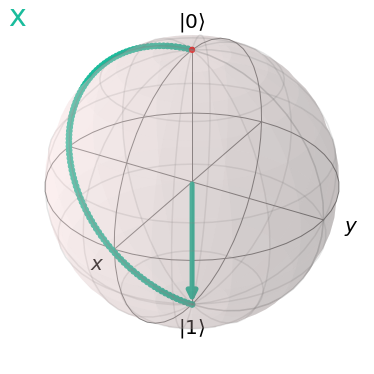

In [6]:
# Visualize the X gate on the Bloch sphere
visualize_transition(qc, trace=True)

<a id="q1a"></a>
# Practice: Implementing single qubit gates
## Single Qubit Gates

### *The X Gate* 
The X gate rotates the state vector by $\pi$ radians around the x-axis on the Bloch sphere.

The syntax for an X gate is: `qc.x(target)` , where `qc` is an initialized `QuantumCircuit` and `target` is the number of the qubit where you would like to apply the gate.

**Block 1:**
Initialize a new circuit, add an X gate to the circuit, and then draw the circuit.

In [7]:
# BLOCK 1

# TODO

<a id="q1b"></a>

### *The Y Gate* 

The Y gate rotates the state 180 degrees arout the y-axis on the Bloch sphere.

The syntax for a Y gate is: `qc.y(target)` , where `qc` is an initialized `QuantumCircuit` and `target` is the number of the qubit where you would like to apply the gate.

**Block 2:**
Initialize a new circuit, and add a Y gate to the circuit, and then draw the circuit.

In [8]:
# BLOCK 2

# TODO

<a id="q1c"></a>
### The Z Gate

The Z gate rotates the state vector by $\pi$  radians around the z-axis on the Bloch sphere.

The syntax for a Z gate is: `qc.z(target)` , where `qc` is an initialized `QuantumCircuit` and `target` is the number of the qubit where you would like to apply the gate.

**BLOCK 3:**
Initialize a new circuit, add a Z gate to the circuit, and then draw the circuit.

In [9]:
# BLOCK 3

# TODO

<a id="q1c"></a>
### The H Gate

The H gate rotates the state vector by $\pi$  radians arout the xz-diagonal axis on the Bloch sphere.

The H gate creates a superposition.

We will discuss the implications of this gate in Lab 2. For now, we will only focus on gates as rotations of the Bloch sphere.

The syntax for a H gate is: `qc.h(target)` , where `qc` is an initialized `QuantumCircuit` and `target` is the number of the qubit where you would like to apply the gate.

**BLOCK 4:**
Initialize a new circuit, add a H gate to the circuit, and then draw the circuit.

In [10]:
# BLOCK 4

# TODO

**BLOCK 5:** Visualize the rotation on the bloch sphere of the H gate.

In [11]:
# BLOCK 5

# TODO

### The Measurement Gate



The Measurement gate tells the qiskit `backend` when it is time to check the state of our qubits. Without applying a measurement gate to the circuit, the output of this step will be the default 0 state.

There are multiple ways to apply measurement gates in `qiskit`. We have found the `qc.measure([qubits],[classical]` method to be the most simple and specific approach. Here, we provide a list of each qubit and a list to their respective classical bits that we want to measure each qubit to.

This following example would measure the 0th qubit to the 0th classical bit, the 1st qubit to the 1st classical bit, and so on...

```python
qc = QuantumCircuit(3,3)
qc.h(0)
qc.x(1)
qc.y(2)
qc.measure([0,1,2],[0,1,2])
```


**BLOCK 6:**
Initialize a new circuit with 2 qubits and 2 classical bits, apply a Hadamard gate to each qubit, add measurement gates to the circuit, and then draw the circuit.

In [12]:
# BLOCK 6

# TODO

# Simulating circuits


The `aer_simulator` : an idealized simulator that emulates a perfect quantum computer.

Using a simulator has 3 steps:
1. Creating the backend. This step tells qiskit where to run our circuit. Here, we use a simulator:
``` python
qsim = Aer.get_backend('aer_simulator')
```
2. Creating a job. This step asks the backend to run your circuit.
``` python
job = execute(qc, backend=qsim, shots=1024)
```
3. Pulling the results from the job. This step contains all the information from the experiment.
``` python 
result = job.result()
```

Once the result of the simulation has been received, we normally like to visualize the counts of the states we measured in a histogram.
Plotting counts in a histogram involves two steps:
1. Getting the counts. This step tells us how many of each state we have.
```python
counts = result.get_counts(qc) 
```
2. Plotting the counts. This step visualizes the counts in a bar graph!
``` python
plot_histogram(counts)
```

**BLOCK 7:** Create a new 1 qubit, 1 classical bit quantum circuit. Then add the X,Y,H, and Z gates. Simulate the results.

In [13]:
# BLOCK 7

# TODO

## Run on a real quantum computer! *(OPTIONAL EXTRA WORK - NOT REQUIRED)*



First, we need to find the least busy backend:
```python
provider = IBMQ.get_provider(hub='ibm-q')
backend = least_busy(provider.backends(filters=lambda x: x.configuration().n_qubits >= 2 
                                       and not x.configuration().simulator 
                                       and x.status().operational==True))
print("least busy backend: ", backend)
```

Next, we can send the job to be run in the notebook.
``` python
job = execute(qc, backend=backend, shots=100)
result = job.result()
```

Last, we can again plot the results in a histogram:

``` python
counts = result.get_counts(qc)
plot_histogram(counts)
```

**N.B.** *If you are not running on IQX you will need to load in your token*

**BLOCK 8:** Try and run this script on a real device. (It may take a while...)

In [14]:
# BLOCK 8
# Try and run this script on a real device (it may take a long time...)


---
# Extra content - Not Required

### Qiskit as a python object!

When we make a `qc = QuantumCircuit(1,1)` object, any gate applied to the quantum circuit will alter the original `qc` object. This allows us a very pythonic way to create quantum circuits using functions:

``` python
def circuit_altering_function(qc, qubit):
    qc.x(qubit)
```

**EXAMPLE:** (We've done this for you!) Define a function that applies a X gate to a `qc` argument. 

Your function should take in two arguments: a `target` qubit, and a `QuantumCircuit` object. Your function should then return an altered QuantumCircuit object.

In [15]:
# EXAMPLE
def apply_x(qubit, qc):
    qc.x(qubit)
    return qc

**BLOCK 9:** Define a function that applies a Y gate to a `qc` argument.

Your function should take in two arguments: a `target` qubit, and a `QuantumCircuit` object and return an altered QuantumCircuit object.

In [16]:
# BLOCK 9

# TODO

**BLOCK 10:** Define a function that applies a Z gate to a `qc` argument.

Your function should take in two arguments: a `target` qubit, and a `QuantumCircuit` object. Your function should then return an altered QuantumCircuit object.

In [17]:
# BLOCK 10

# TODO

**BLOCK 11:** Define a function that applies a H gate to a `qc` argument.

Your function should take in two arguments: a `target` qubit, and a `QuantumCircuit` object. Your function should then return an altered QuantumCircuit object.

In [18]:
# BLOCK 11

# TODO

**BLOCK 12:** Define a function that applies measurement gates to a `qc` argument.

Your function should take in two #PHIL (three??) arguments: a `qubit list`, a `classical bit list`, and a `QuantumCircuit` object. Your function should then return an altered QuantumCircuit object.

In [19]:
# BLOCK 12

# TODO

**BLOCK 13:** Define a function that takes in a `qc` argument, requests a backend, runs the job, and returns the result.

Your function should take in `QuantumCircuit` object and return a job `result` object.

In [20]:
# BLOCK 13

# TODO

**EXAMPLE 14:** (We've done this for you.) Define a function that takes in a `result` object and plots a histogram.

(Note that you will have to return the result of `plot_histogram` to see the results.)

In [21]:
# EXAMPLE 14

def plot_graph(result):
    counts = result.get_counts()
    hist = plot_histogram(counts)
    return hist

### Put it all together!

**BLOCK 15:**
Create a function that takes a python list of `("gate", qubit)` tuples of type `str` and `int` , respectively. For example: `[("H",1),("X",2),("Y",0),("Z",1)]` creates a quantum circuit of the necessary size. (think carefully about how  the QuantumCircuit needs to be initialized), applies each of the gates using the functions above, and plots a histogram of the measured results.

In [22]:
# BLOCK 15

def circuit_builder(gate_list):
    # TODO
    apply_measure([num for num in range(max_qubits)], [num for num in range(max_qubits)],  qc)
    result = simulate(qc)
    return plot_graph(result)

In [ ]:
# Test case:
q_list = [("H",1),("X",2),("Y",0),("Z",1)]

circuit_builder(q_list)

### © 2022 The Coding School

**All rights reserved**

*Use of this activity is for personal use only. Copying, reproducing, distributing, posting or sharing this activity in any manner with any third party are prohibited under the terms of this registration. All rights not specifically licensed under the registration are reserved.*